In [29]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.constants as constants
from qiskit_signals.quantum_axis import (
    AngularWavenumberAxis,
    EncodingType,
    PositionAxis,
)
from wave_optics_propagation.analytics import (
    free_space_propagated_gaussian_wavefront,
    gaussian_signal,
    propagated_gaussian_wavefront_hitting_lens,
)
from wave_optics_propagation.visualization import plot_wavefunction

### Initial parameters


In [30]:
# beam parameters
vacuum_wavelength = 1e-6
# beam_FWHM = 5e-3 * 1e-2
beam_FWHM = 25e-3 * 1e-2

# lens parameters
focal_length = 200e-3 * 1e-2
# lens_diameter = 25e-3
refractive_index = 1.5

# free space propagation parameters
propagation_after_lens = 1.5 * focal_length

# simulation parameters
transverse_length = 100e-3 * 1e-2  # transverse simulation window
num_of_steps_after_lens = 10
lens_slices = 10000
num_qubits = 6
max_delta = 0.0001

# lens_diameter = 50e-3 * 1e-2
lens_diameter = transverse_length

### Constants


In [31]:
c = constants.c
# hbar = constants.hbar

### Derived parameters


In [32]:
# geometry
radius_of_curvature = focal_length * (refractive_index - 1)
lens_radius = lens_diameter / 2
lens_thickness = radius_of_curvature - np.sqrt(radius_of_curvature**2 - lens_radius**2)


k_0 = 2 * constants.pi / vacuum_wavelength
reduced_wavelength = vacuum_wavelength / refractive_index

dimension = 2**num_qubits
delta_x = transverse_length / dimension

gaussian_mean = transverse_length / 2
gaussian_beam_waist = beam_FWHM / np.sqrt(2 * np.log(2))
# gaussian_sigma = gaussian_beam_waist / np.sqrt(2)

# vacuum_rayleigh_length = (np.pi * gaussian_beam_waist**2) / vacuum_wavelength

lens_slice_thickness = lens_thickness / lens_slices
# step_size_after_lens = propagation_after_lens / num_of_steps_after_lens

In [33]:
print(delta_x, vacuum_wavelength)

1.5625e-05 1e-06


In [34]:
x_axis = PositionAxis(
    num_qubits=num_qubits, delta_x=delta_x, encoding=EncodingType.UNSIGNED
)
twos_complement_x_axis = PositionAxis(
    num_qubits=num_qubits,
    delta_x=delta_x,
    encoding=EncodingType.TWOS_COMPLEMENT_MIRRORED,
)
k_axis = AngularWavenumberAxis.from_position_axis(x_axis)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

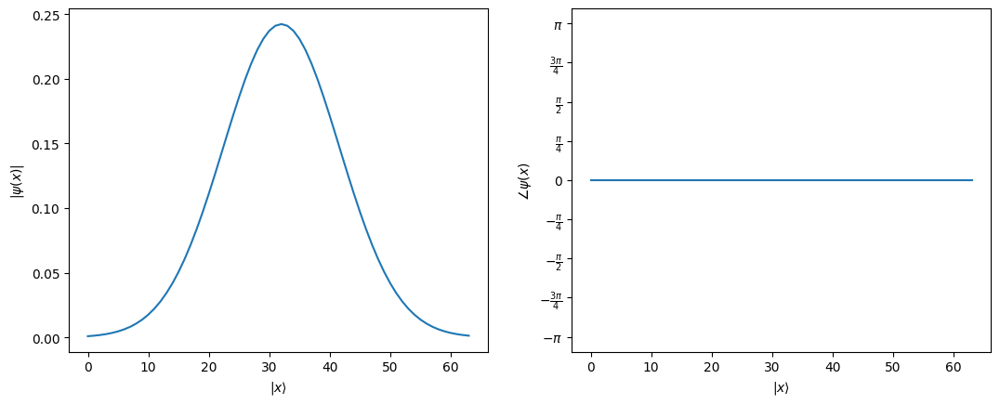

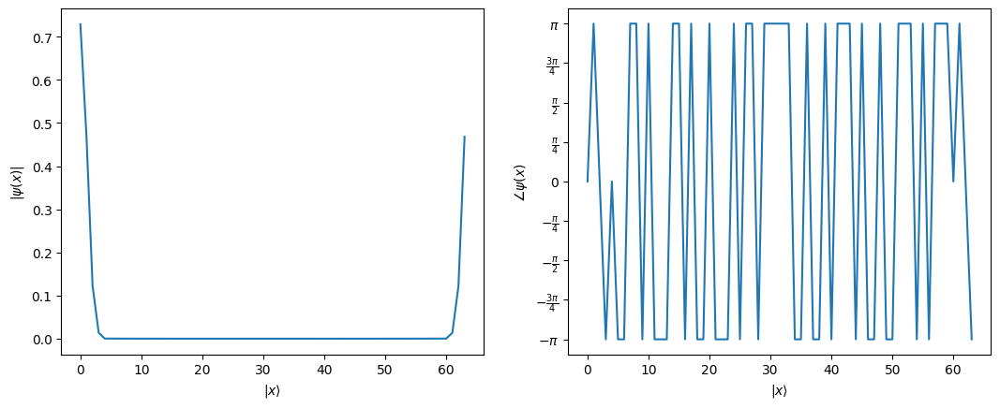

In [35]:
initial_wavefunction = gaussian_signal(
    x_axis,
    gaussian_beam_waist,
    gaussian_mean,
)
plot_wavefunction(initial_wavefunction.data)
plot_wavefunction(np.fft.fft(initial_wavefunction.data, norm="ortho"))

A lens applies a phase as

$$
e^{-ik_0\frac{x^2}{2f}}
$$


-1023.9999999999998


(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

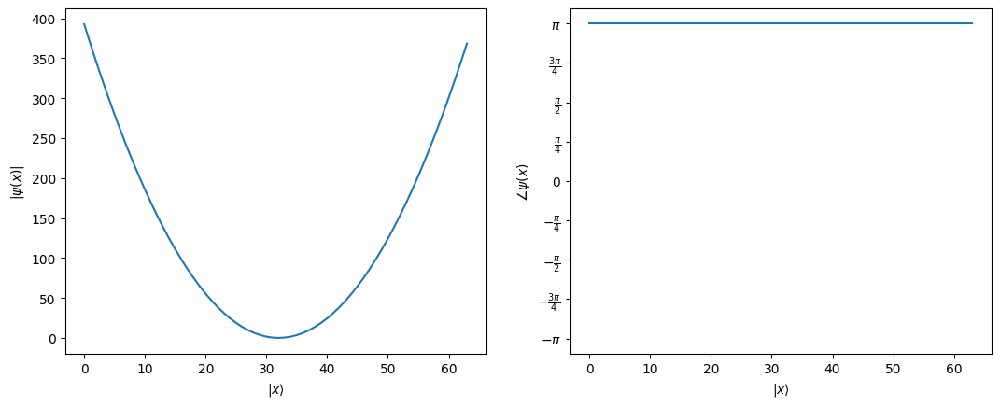

In [36]:
from qiskit_signals.quantum_signal import PolynomialQuantumSignal

lens_signal = PolynomialQuantumSignal(
    axis=twos_complement_x_axis, alpha=-k_0 / 2 / focal_length, power=2
)

print((lens_signal.data / k_0 * 2 * focal_length / delta_x**2).min())
plot_wavefunction(lens_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

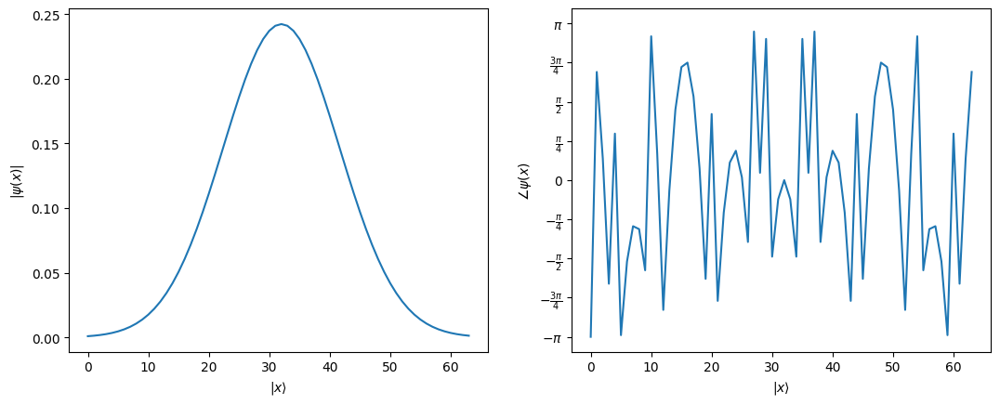

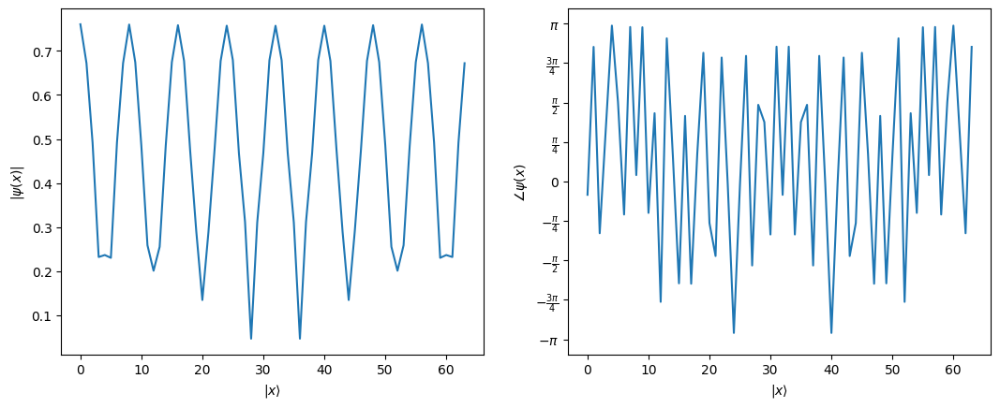

In [37]:
wavefront_after_lens = initial_wavefunction.data * np.exp(1j * lens_signal.data)
plot_wavefunction(wavefront_after_lens)
plot_wavefunction(np.fft.fft(wavefront_after_lens, norm="ortho"), normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

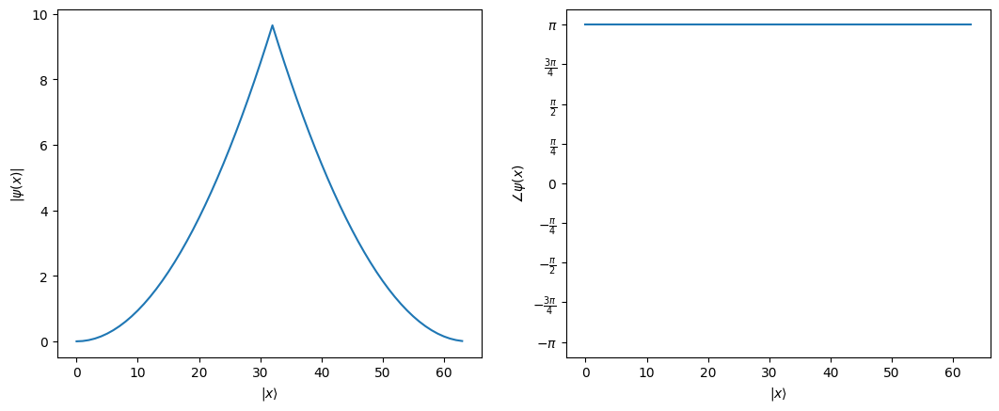

In [38]:
from wave_optics_propagation.elements import free_space_signal_generator

free_space_signal = free_space_signal_generator(
    k_axis,
    delta_t=propagation_after_lens / constants.c,
    wavelength=vacuum_wavelength,
    c=constants.c,
)

plot_wavefunction(free_space_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

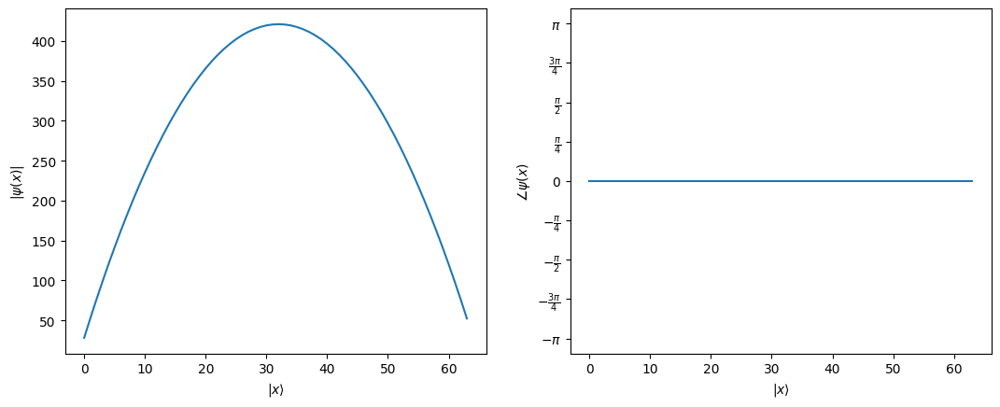

In [39]:
from wave_optics_propagation.elements import (
    radius_of_convex_planar_lens_as_a_func_of_z,
    thin_transparent_plate_signal_generator,
)

lens_slice_positions = (
    np.linspace(0, lens_thickness, lens_slices, endpoint=False)
    + lens_slice_thickness / 2
)  # choosing the midpoint in each transverse slice

lens_transverse_radii = [
    radius_of_convex_planar_lens_as_a_func_of_z(
        radius_of_curvature, z, lens_thickness, fresnel_approximation=True
    )
    for z in lens_slice_positions
]


lens_signals = [
    thin_transparent_plate_signal_generator(
        x_axis=x_axis,
        refractive_index=refractive_index,
        thickness=lens_slice_thickness,
        radius=lens_radius,
        wavelength=vacuum_wavelength,
        # scale_down=True,
        scale_down=False,
    )
    for lens_radius in lens_transverse_radii
]

sum_signal = np.zeros_like(lens_signals[0].data)
for signal in lens_signals:
    sum_signal += signal.data

plot_wavefunction(sum_signal, normalize=False)

[420.89895338 420.89804903 420.90652658 420.88229666 420.90953801
 420.9040719  420.90798769 420.87919602 420.90187562 420.89184775
 420.89120178 420.89993771 420.87596619 420.90346592 420.8982582
 420.90243238 420.87389909 420.89683707 420.88706759 420.88668001
 420.89567433 420.91405055 420.89971932 420.89476998 420.89920254
 420.91301701 420.89412401 420.88461292 420.88448372 420.89373643
 420.91237104 420.89829819 420.89360724 420.89829819 420.91237104
 420.89373643 420.88448372 420.88461292 420.89412401 420.91301701
 420.89920254 420.89476998 420.89971932 420.91405055 420.89567433
 420.88668001 420.88706759 420.89683707 420.87389909 420.90243238
 420.8982582  420.90346592 420.87596619 420.89993771 420.89120178
 420.89184775 420.90187562 420.87919602 420.90798769 420.9040719
 420.90953801 420.88229666 420.90652658 420.89804903]
28.19987168497706 -392.6990816987241
420.8936072383833 -0.0
420.8936072384665 1262.6808217153994


(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

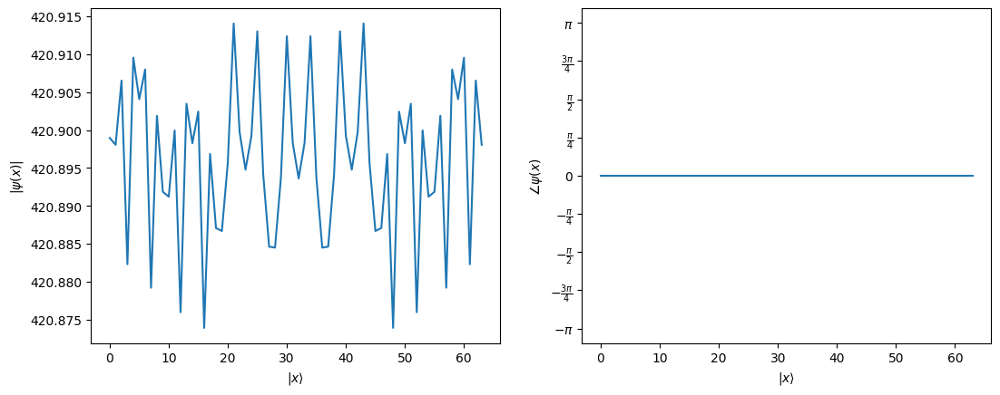

In [40]:
print(sum_signal - lens_signal.data)
print(sum_signal[0], lens_signal.data[0])
print(sum_signal[len(sum_signal) // 2], lens_signal.data[len(lens_signal.data) // 2])
print(
    refractive_index * k_0 * lens_thickness / 3, refractive_index * k_0 * lens_thickness
)
# assert np.allclose(sum_signal, lens_signal.data)
plot_wavefunction(sum_signal - lens_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

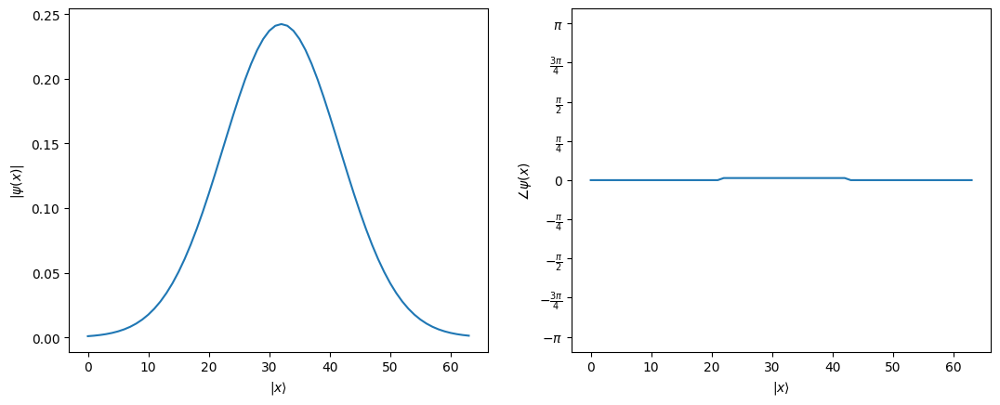

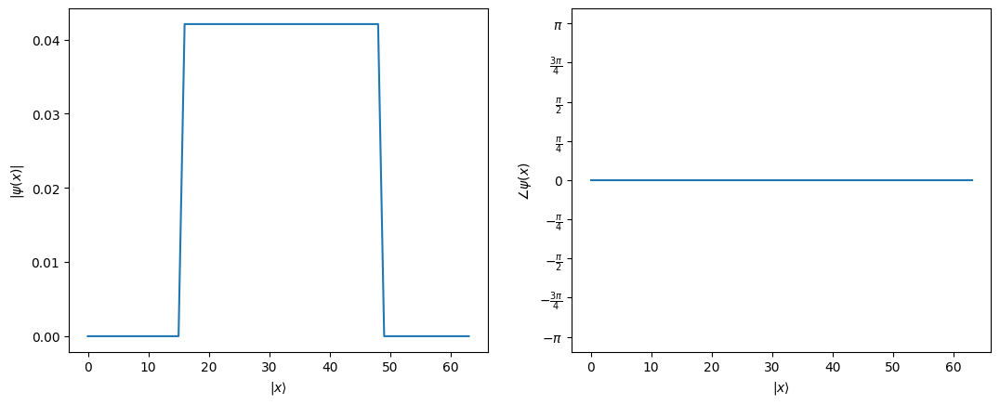

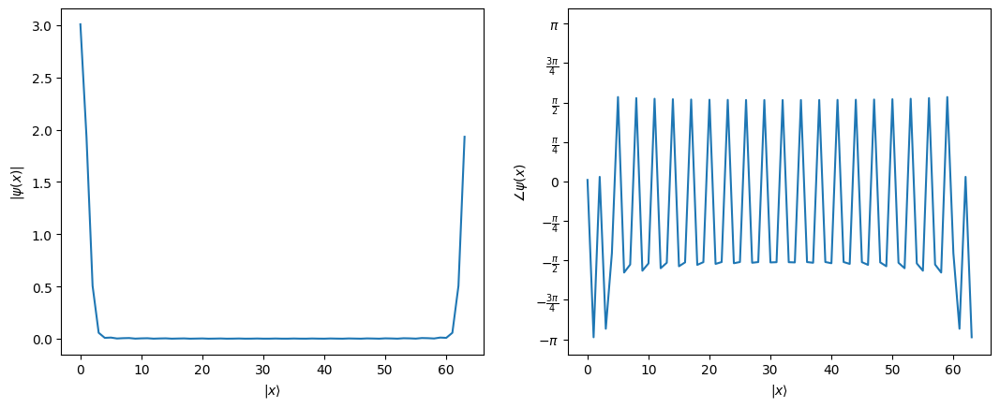

In [41]:
signal_data = initial_wavefunction.data.copy()
signal_data = signal_data * np.exp(1j * lens_signals[lens_slices // 10].data)
plot_wavefunction(signal_data)
plot_wavefunction(lens_signals[lens_slices // 4].data, normalize=False)
plot_wavefunction(np.fft.fft(signal_data, norm="ortho"), normalize=False)

Doing lens slice 1/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 2/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 3/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 4/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 5/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 6/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 7/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 8/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.0017715142861420843
Doing lens slice 9/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.001

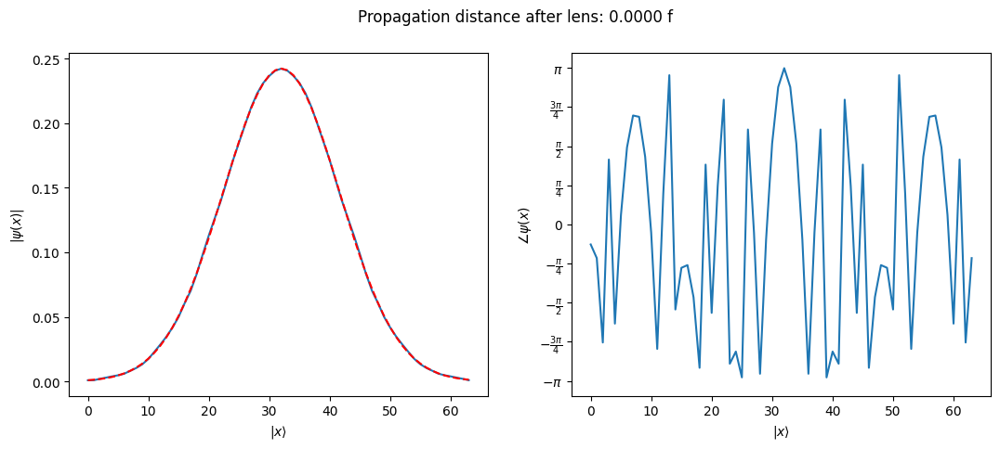

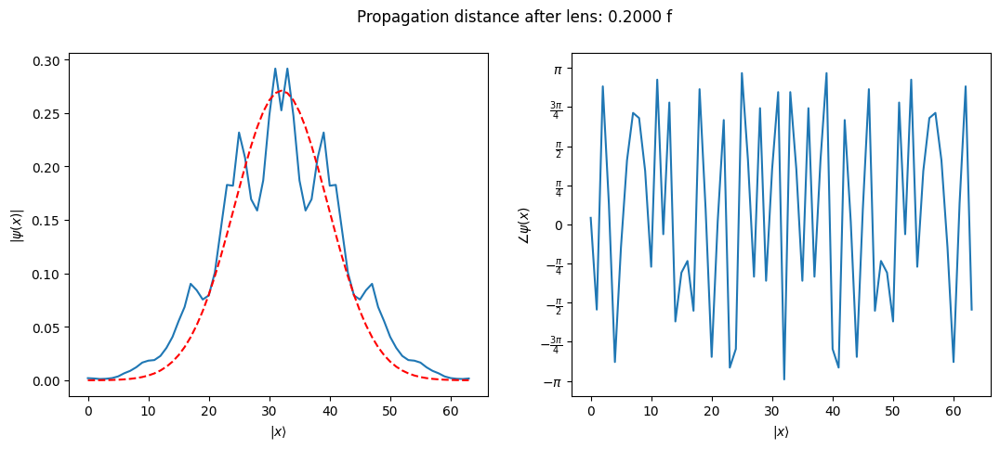

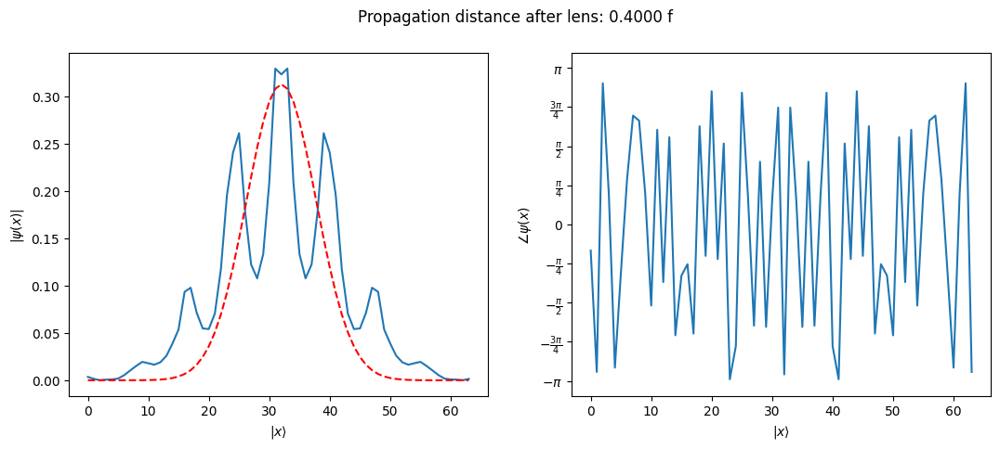

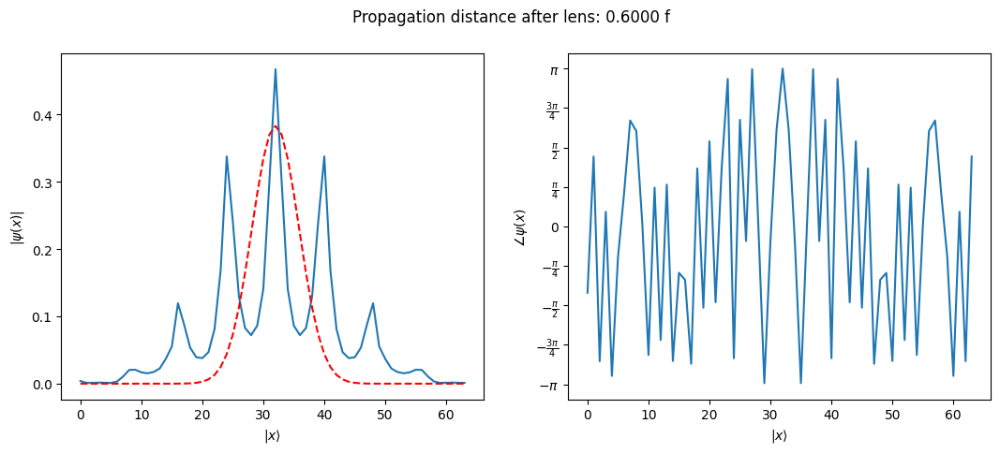

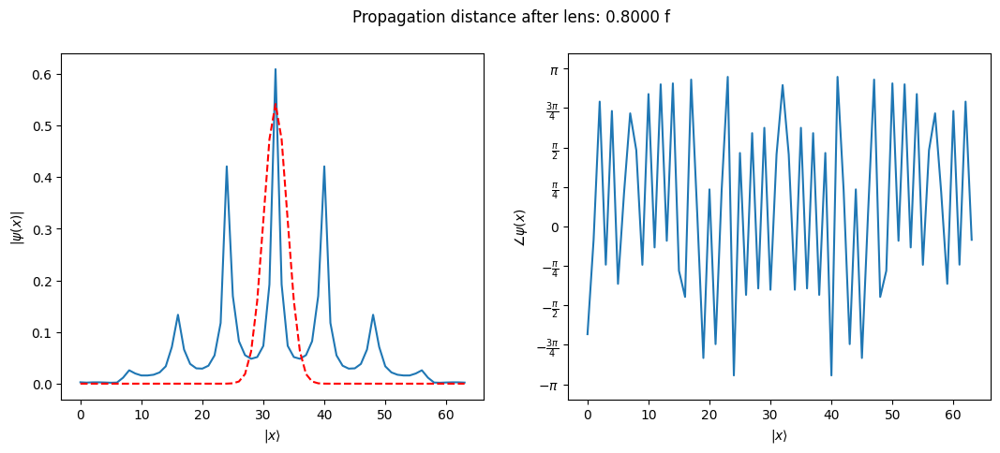

...

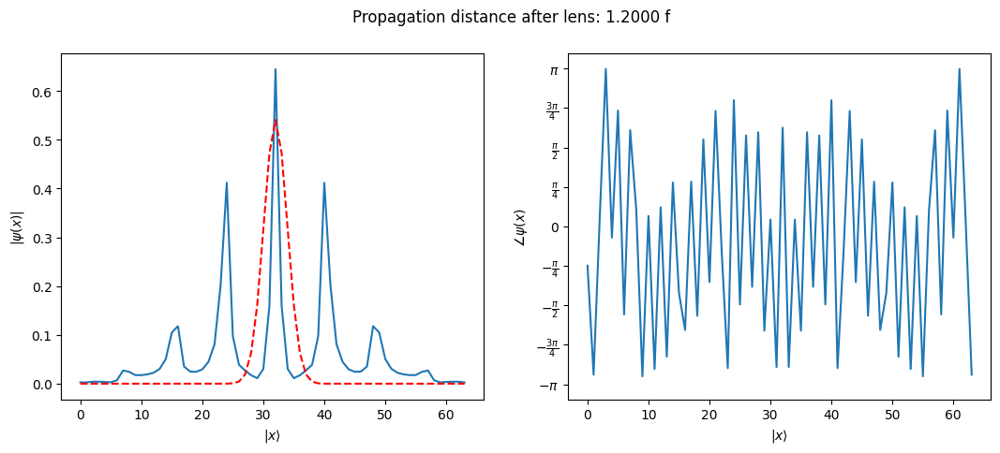

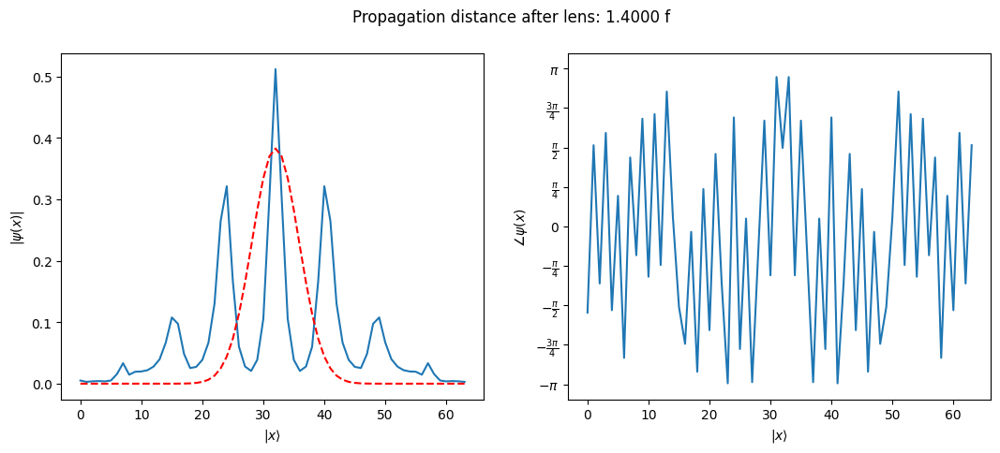

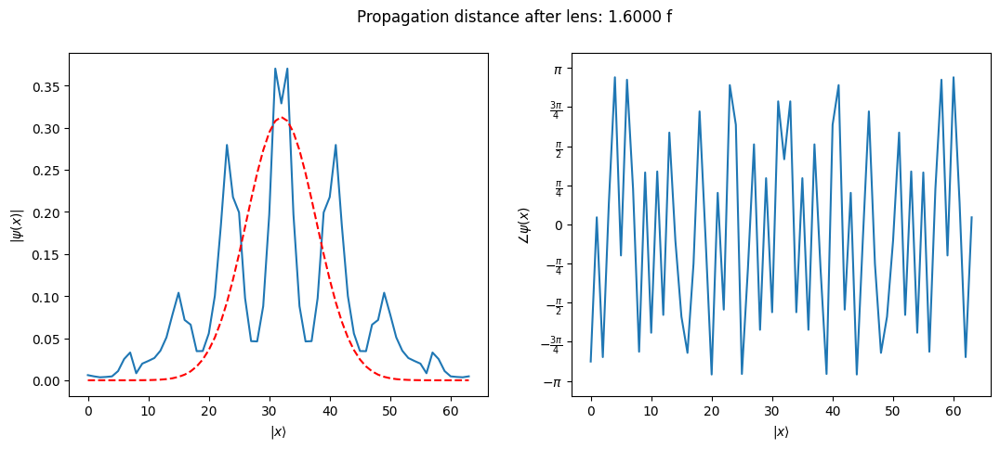

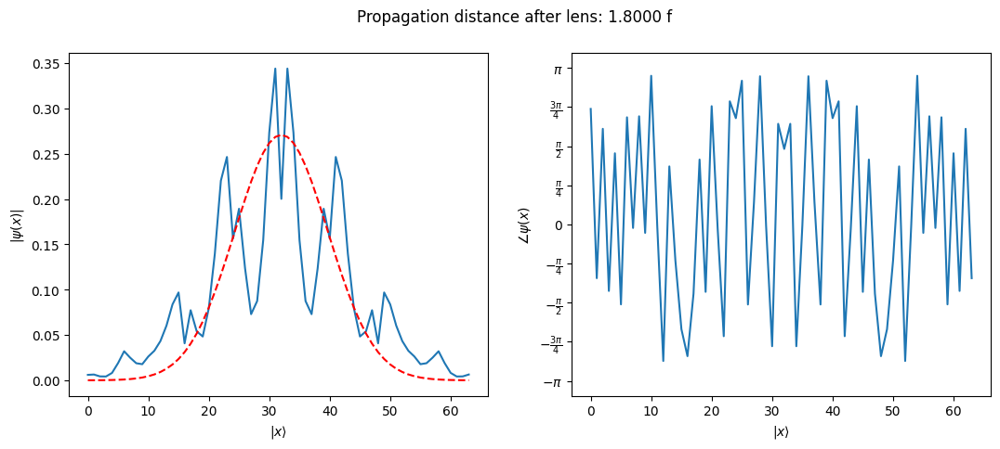

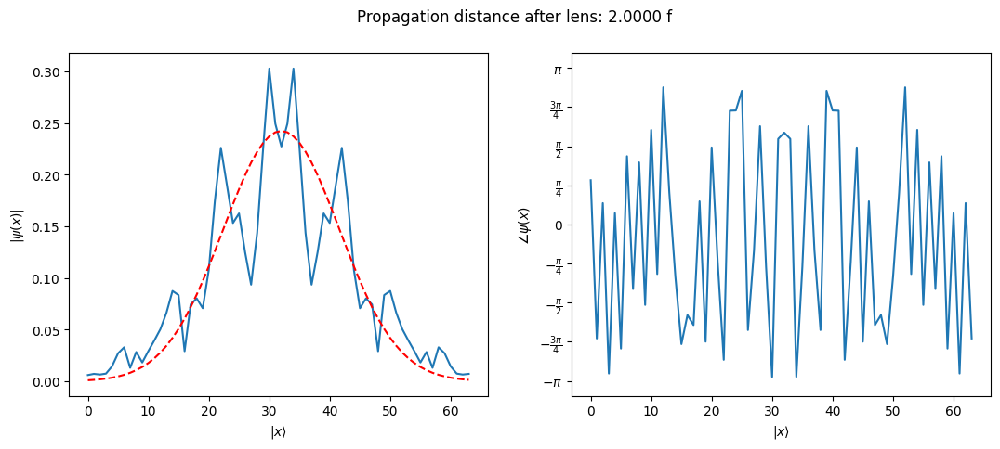

In [42]:
zs = (
    np.array([0.0, 0.2, 0.4, 0.6, 0.8, 0.9, 1.0, 1.1, 1.2, 1.4, 1.6, 1.8, 2.0])
) * focal_length - lens_thickness

for z in zs:
    inside_lens_propagation_remained = lens_thickness
    total_lenses_simulated = 0
    signal_data = initial_wavefunction.data.copy()
    step_size_after_lens = z / num_of_steps_after_lens

    for i, lens_radius in enumerate(lens_transverse_radii):
        print(f"Doing lens slice {i + 1}/{lens_slices}")

        lens_signal_loop = lens_signals[i]

        if not np.isclose(np.std(lens_signal_loop.data), 0):
            print(f"max value in signal: {np.max(np.abs(lens_signal_loop.data))}")
            print(
                f"sum of amplitude square: {np.sum(np.abs(lens_signal_loop.data) ** 2)}"
            )
            # continue
            signal_data = signal_data * np.exp(1j * lens_signal_loop.data)
            total_lenses_simulated += 1

        else:
            print("Skipped the lens slice because it is a flat phase.")
            break

        propagator_signal = free_space_signal_generator(
            k_axis=k_axis,
            delta_t=lens_slice_thickness / c,
            wavelength=vacuum_wavelength,
            c=constants.c,
        )

        fourier_transformed = np.fft.fft(signal_data, norm="ortho")
        propagated = fourier_transformed * np.exp(1j * propagator_signal.data)
        signal_data = np.fft.ifft(propagated, norm="ortho")

        inside_lens_propagation_remained -= lens_slice_thickness

    # remaining propagation once the lens slice grows larger than the simulation window
    while inside_lens_propagation_remained > 0:
        propagator_signal = free_space_signal_generator(
            k_axis=k_axis,
            delta_t=inside_lens_propagation_remained / c,
            wavelength=reduced_wavelength,
            c=constants.c,
        )

        fourier_transformed = np.fft.fft(signal_data, norm="ortho")
        propagated = fourier_transformed * np.exp(1j * propagator_signal.data)
        signal_data = np.fft.ifft(propagated, norm="ortho")

        inside_lens_propagation_remained -= inside_lens_propagation_remained

    for i in range(num_of_steps_after_lens):
        print(f"Doing free space step {i + 1}/{num_of_steps_after_lens}")

        propagator_signal = free_space_signal_generator(
            k_axis=k_axis,
            delta_t=step_size_after_lens / c,
            wavelength=vacuum_wavelength,
            c=constants.c,
        )

        fourier_transformed = np.fft.fft(signal_data, norm="ortho")
        propagated = fourier_transformed * np.exp(1j * propagator_signal.data)
        signal_data = np.fft.ifft(propagated, norm="ortho")

    fig, (ax1, ax2) = plot_wavefunction(signal_data)

    R_z, w_z = propagated_gaussian_wavefront_hitting_lens(
        gaussian_beam_waist,
        z + lens_thickness,
        focal_length,
        vacuum_wavelength,
        1,
    )

    signal_with_lens = gaussian_signal(x_axis, w_z, gaussian_mean)
    ax1.plot(signal_with_lens.data / np.linalg.norm(signal_with_lens.data), "r--")

    fig.suptitle(
        f"Propagation distance after lens: {(z + lens_thickness) / focal_length:.4f} f"
    )
